# Space AG Data Analyst Challenge 

## Read in data

In [91]:
import json, re, glob
import geopandas as gpd
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm
from shapely.geometry import Polygon
import datetime
import rasterio
from rasterio.plot import reshape_as_image
import rasterio.mask
from rasterio.features import rasterize


from shapely.ops import cascaded_union
from rasterio.features import rasterize

from sentinelhub import WmsRequest, WcsRequest, MimeType, WebFeatureService,FisRequest, BBox, Geometry, CRS, WcsRequest, CustomUrlParam, DataSource, HistogramType, get_area_info
from sentinelhub.time_utils import iso_to_datetime


%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [78]:
# read in json
with open('farm_map.json') as f:
    data = json.load(f)

In [79]:
data.keys()

dict_keys(['crs', 'setup', 'type', 'features'])

In [80]:
#check geom types
for feature in data['features']:
    print(feature['geometry']['type'])

Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon
Polygon


In [81]:
#read using gpd
farm = gpd.read_file("farm_map.json")
farm.head()

,values,unit,geometry
0,"[ { ""value"": 3581.158766, ""variety"": { }, ""mea...","{'state': {'area': 6.530601, 'year_of_planting...","POLYGON ((-75.63966 -14.19970, -75.64232 -14.2..."
1,"[ { ""value"": 4037.375179, ""variety"": { }, ""mea...","{'state': {'area': 6.555069, 'year_of_planting...","POLYGON ((-75.64232 -14.20063, -75.64498 -14.2..."
2,"[ { ""value"": 4658.420440, ""variety"": { }, ""mea...","{'state': {'area': 6.533254, 'year_of_planting...","POLYGON ((-75.63899 -14.20153, -75.64165 -14.2..."
3,"[ { ""value"": 4196.272166, ""variety"": { }, ""mea...","{'state': {'area': 6.551013, 'year_of_planting...","POLYGON ((-75.64165 -14.20245, -75.64432 -14.2..."
4,"[ { ""value"": 4744.580970, ""variety"": { }, ""mea...","{'state': {'area': 6.534646, 'year_of_planting...","POLYGON ((-75.64165 -14.20245, -75.63899 -14.2..."


In [82]:
#polygon sizes
farm.geometry.area

0     0.000005
1     0.000005
2     0.000005
3     0.000005
4     0.000005
5     0.000005
6     0.000005
7     0.000005
8     0.000005
9     0.000006
10    0.000005
11    0.000005
12    0.000005
13    0.000005
14    0.000005
15    0.000006
16    0.000005
17    0.000005
18    0.000005
19    0.000005
20    0.000005
21    0.000005
22    0.000005
23    0.000005
24    0.000005
25    0.000005
26    0.000005
27    0.000005
28    0.000005
29    0.000005
30    0.000005
31    0.000005
32    0.000005
dtype: float64

In [83]:
#check geom is in shapely and can be displayed
print(type(farm.geometry)) #check is shapely object
#check crs
print(farm.crs) #  = EPSG identifier of WGS84.

<class 'geopandas.geoseries.GeoSeries'>
{'init': 'epsg:4326'}


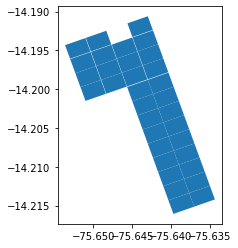

In [84]:
#plot coordinates
farm.plot()

In [85]:
farm.geometry.bounds

,minx,miny,maxx,maxy
0,-75.642984,-14.200629,-75.639658,-14.197876
1,-75.645651,-14.201559,-75.642317,-14.198803
2,-75.642317,-14.202454,-75.638989,-14.199701
3,-75.644984,-14.203384,-75.641650,-14.200629
4,-75.641650,-14.204280,-75.638321,-14.201527
5,-75.644319,-14.205212,-75.640982,-14.202454
6,-75.640982,-14.206095,-75.637657,-14.203352
7,-75.643652,-14.207029,-75.640319,-14.204280
8,-75.640319,-14.207924,-75.636986,-14.205165
9,-75.642990,-14.208854,-75.639650,-14.206095


## Create area of interest to extract sentinel image


                                              values  \
0  [ { "value": 3581.158766, "variety": { }, "mea...   
1  [ { "value": 4037.375179, "variety": { }, "mea...   

                                                unit  \
0  {'state': {'area': 6.530601, 'year_of_planting...   
1  {'state': {'area': 6.555069, 'year_of_planting...   

                                            geometry  dissolve  
0  POLYGON ((-75.63966 -14.19970, -75.64232 -14.2...         1  
1  POLYGON ((-75.64232 -14.20063, -75.64498 -14.2...         1  


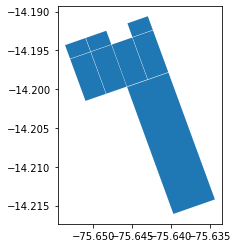

In [86]:
#create attribute to be dissolved
farm['dissolve'] = 1
print(farm.head(2))
#create Area of Interest
bbox = farm.dissolve(by='dissolve')
bbox.plot()

In [87]:
#print boundaries
print(bbox.geometry.bounds)

               minx       miny       maxx      maxy
dissolve                                           
1        -75.653648 -14.216077 -75.634345 -14.19061


In [88]:
#bounding box coordinates
farm_coords_wgs = [-75.653648, -14.216077, -75.634345, -14.19061]
#input with CRS
farm_bbox = BBox(bbox=farm_coords_wgs, crs=CRS.WGS84)

## Extract Sentinel data


In [13]:
#sentinel log in
from sentinelhub import SHConfig
INSTANCE_ID = '293d73d3-f1a2-4427-8486-9f05aa08443f'

if INSTANCE_ID:
    config = SHConfig()
    config.instance_id = INSTANCE_ID
else:
    config = None

In [14]:
search_time_interval = ('2016-07-15T00:00:00', '2020-04-20T23:59:59')

In [20]:
#search by location and time interval using Sentinel Hub Web Feature Service (WMS)

wms_ndvi_request = WmsRequest(
    layer='NDVI',
    bbox=farm_bbox, 
    time=search_time_interval, 
    width=512,
    height=856,
    config=config
)

wms_ndvi_img = wms_ndvi_request.get_data()
print('Returned data is of type = %s and length %d.' % (type(wms_ndvi_img), len(wms_ndvi_img)))

Returned data is of type = <class 'list'> and length 204.


In [ ]:
# WMS request - hard download rasters

#creates folder called rasters
#searches for the layer NDVI

wms_ndvi_img = wms_ndvi_request.get_data(save_data=True)
print('There are %d Sentinel-2 images available in specified time range' % len(wms_true_color_img))

print('These %d images were taken on the following dates:' % len(wms_ndvi_img))
for index, date in enumerate(wms_ndvi_request.get_dates()):
    print(' - image %d was taken on %s' % (index, date))

In [ ]:
#check the folder created and the filepaths
import os

for folder, _, filenames in os.walk(wms_bands_request.data_folder):
    for filename in filenames:
        print(os.path.join(folder, filename))

## Binary mask for each plot

In [103]:
#set up function that extracts the time from json file accompanying raster
def get_time(rasterpath): 
    # read file
    rdir = os.path.dirname(rasterpath)
    js = "request.json"
    jason = os.path.join(rdir,js)
  
    # Opening JSON file 
    f = open(jason,) 
    data = json.load(f) 

    # Iterating through the json 
    url = data['url']
    spl = url.split("&TIME=",1)[1]
    time = spl[:10] #extracts the date of image acquisition
    #extracts the time
    
    return time

In [ ]:
#create shp for each plot

outpath = r"C:/Users/dr_sc/Desktop/Space_AG/adoval4-space-ag-data-analyst-challenge-37385be5a0c7/Vectors/" 

for i in range(0,33):
    start = i
    end = start +1
    selection = farm[start:end] #extract a shp from each row of farm df
    outname = outpath + "{}.shp".format(i) 
    selection.to_file(outname) #write out shp
    


In [255]:

#search directory to find land plots
vector_shps = glob.glob('C:/Users/dr_sc/Desktop/Space_AG/adoval4-space-ag-data-analyst-challenge-37385be5a0c7/Vectors/*.shp', recursive=True)
#search directory to find downloaded images
rasterfiles = glob.glob('C:/Users/dr_sc/Desktop/Space_AG/adoval4-space-ag-data-analyst-challenge-37385be5a0c7/rasters/**/*.tiff', recursive=True)

#initiate lists
img_means = []
times = []
vectors = []
rasters = []

#for each vector iterate through each raster and extract the mean value of the clipped area
# and write clipped area into raster folder
for v in vector_shps:
    for raster in rasterfiles:
        #open up one of the plots
        vector_shape = v
        with fiona.open(vector_shape, "r") as shapefile:
            shapes = [feature["geometry"] for feature in shapefile]
        try:
            with rasterio.open(raster) as src:
                out_image, out_transform = rasterio.mask.mask(src, shapes,  crop=True, all_touched=True)
                out_meta = src.meta

            out_meta.update({"driver": "GTiff",
                         "height": out_image.shape[1],
                         "width": out_image.shape[2],
                         "transform": out_transform})
            
            #mean with zeros
            #out_image.mean()

            #mean without zeros which are outside the selection area
            img_mean = out_image[out_image.nonzero()].mean()
    
            #get date of image acquisition from json file
            img_acq = get_time(raster)
            
            #Section writes the raster clipped out to this directory
            
            #raster dir
            rdir = os.path.dirname(raster)
            
            #vector dir - split to be used in raster renaming
            filename = os.path.basename(v)
            # Use splitext() to get filename and extension separately.
            (fname, ext) = os.path.splitext(filename)
            plotname = fname
            
            raster_clip_name = "{}_plot{}.tiff".format(img_acq,plotname) 
            
            rname = "rasters/Clipped_rasters/{}".format(raster_clip_name)
            
            #write out raster
            with rasterio.open(rname, "w", **out_meta) as dest:
                dest.write(out_image)
        
            #append values to lists
            #rasters.append(os.path.basename(raster)) #appends original raster name
            rasters.append(raster_clip_name) #appends new raster name 
            times.append(img_acq)
            vectors.append(os.path.basename(vector_shape))
            img_means.append(img_mean)
            #print(img_mean)
        except:
            pass

#create the df
df = pd.DataFrame(list(zip(vectors, rasters,times,img_means)), 
               columns =['plot', 'raster','time','mean']) 
print(len(df))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: Mean of empty slice.


6737


In [105]:
df.tail()

,plot,raster,time,mean
6732,9.shp,2020-04-29_plot9.tiff,2019-12-27,0.550377
6733,9.shp,2020-04-29_plot9.tiff,2017-01-31,0.460817
6734,9.shp,2020-04-29_plot9.tiff,2017-11-12,0.512093
6735,9.shp,2020-04-29_plot9.tiff,2019-12-17,0.537663
6736,9.shp,2020-04-29_plot9.tiff,2019-09-03,0.582704


In [106]:
df['time'].value_counts() 

2019-12-17    38
2019-10-03    33
2017-10-18    33
2018-05-16    33
2019-07-20    33
              ..
2019-09-28    33
2019-12-07    33
2018-05-21    33
2019-01-26    33
2019-10-18    33
Name: time, Length: 204, dtype: int64

In [115]:
#parse out dates

import datetime
df['year'] = pd.DatetimeIndex(df['time']).year
df['month'] = pd.DatetimeIndex(df['time']).month
df['day'] = pd.DatetimeIndex(df['time']).day


In [116]:
df.head()

,plot,raster,time,mean,year,month,day
0,0.shp,2020-04-29_plot0.tiff,2018-10-13,0.634283,2018,10,13
1,0.shp,2020-04-29_plot0.tiff,2017-01-11,0.701131,2017,1,11
2,0.shp,2020-04-29_plot0.tiff,2019-04-11,0.705880,2019,4,11
3,0.shp,2020-04-29_plot0.tiff,2018-11-05,1.000000,2018,11,5
4,0.shp,2020-04-29_plot0.tiff,2020-01-26,0.655910,2020,1,26


In [ ]:
#create datasets per year
yr_2020 = df.query('year == 2020')
yr_2019 = df.query('year == 2019')
yr_2018 = df.query('year == 2018')
yr_2017 = df.query('year == 2017')
yr_2016 = df.query('year == 2016')

## Overall average values

Text(0, 0.5, 'mean NDVI over farm')

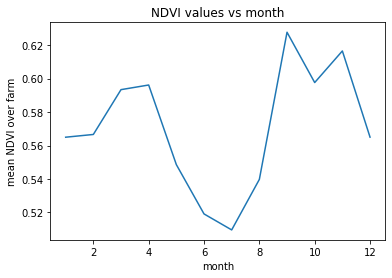

In [165]:
#average monthly NDVI over each month
df.groupby(['month'])['mean'].mean().plot()
plt.title('NDVI values vs month')
plt.xlabel('month') 
# Labeling the Y-axis 
plt.ylabel('mean NDVI over farm') 

Muestra una clara tendencia donde los meses de invierno tienen valores más bajos de NDVI mientras que los valores más altos se dan durante el período que va de septiembre a noviembre.

- una disminución ocurre bastante rápidamente entre abril y julio.
- Julio tiene los valores más bajos en promedio del NDVI del año
- hay un fuerte aumento entre agosto y septiembre
- Los valores máximos se producen en septiembre


## Year analysis

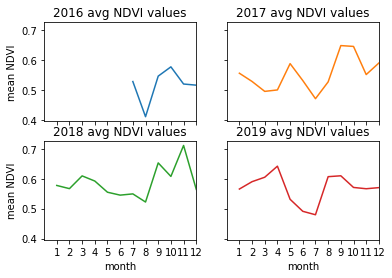

In [200]:
#average analysis over the year 
fig, axs = plt.subplots(2, 2, sharey = True, sharex=True) #ensure same axis
axs[0, 0].plot(yr_2016.groupby(['month'])['mean'].mean())
axs[0, 0].set_title('2016 avg NDVI values')
axs[0, 1].plot(yr_2017.groupby(['month'])['mean'].mean(), 'tab:orange')
axs[0, 1].set_title('2017 avg NDVI values')
axs[1, 0].plot(yr_2018.groupby(['month'])['mean'].mean(), 'tab:green')
axs[1, 0].set_title('2018 avg NDVI values')
axs[1, 1].plot(yr_2019.groupby(['month'])['mean'].mean(), 'tab:red')
axs[1, 1].set_title('2019 avg NDVI values')

for ax in axs.flat:
    ax.set_xlim(0,12)
    ax.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12])
    ax.set(xlabel='month', ylabel='mean NDVI')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()

Text(0, 0.5, 'mean NDVI over farm')

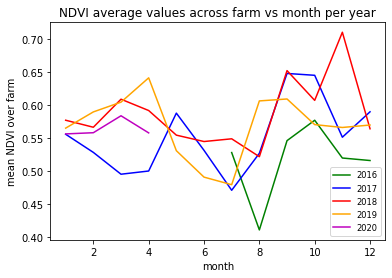

In [164]:
yr_2016.groupby(['month'])['mean'].mean().plot(color = 'g', label='2016')
yr_2017.groupby(['month'])['mean'].mean().plot(color = 'b', label='2017')
yr_2018.groupby(['month'])['mean'].mean().plot(color = 'r', label='2018')
yr_2019.groupby(['month'])['mean'].mean().plot(color = 'orange', label='2019')
yr_2020.groupby(['month'])['mean'].mean().plot(color = 'm', label='2020')
plt.legend(loc = 'lower right', fontsize = 'small')
plt.title('NDVI average values across farm vs month per year')
plt.xlabel('month') 
# Labeling the Y-axis 
plt.ylabel('mean NDVI over farm') 

It shows a clear trend where the winter months have lower NDVI values while the highest values occur during the period from September to November.

- A decline occurs fairly quickly between April and July.
- July has the lowest average NDVI values of the year
- There is a strong increase between August and September
- Peak values occur in September



In [ ]:
#showing outlier of mean in November
df.plot(kind = 'scatter', x='month',y='NDVI mean')
plt.show()
plt.title('NDVI per month from 2016 - 2020')

In [181]:
high_ndvi = df.loc[df['mean'] == 1.0]
high_ndvi.head()

,plot,raster,time,mean,year,month,day
3,0.shp,2020-04-29_plot0.tiff,2018-11-05,1.0,2018,11,5
94,0.shp,2020-04-29_plot0.tiff,2018-11-10,1.0,2018,11,10
208,1.shp,2020-04-29_plot1.tiff,2018-11-05,1.0,2018,11,5
299,1.shp,2020-04-29_plot1.tiff,2018-11-10,1.0,2018,11,10
413,10.shp,2020-04-29_plot10.tiff,2018-11-05,1.0,2018,11,5


In [186]:
print(high_ndvi['year'].value_counts() )
print(high_ndvi['month'].value_counts() )

2018    66
Name: year, dtype: int64
11    66
Name: month, dtype: int64


All outliers appear in November 2018. Note not extracted from data due to time constraints 

## Individual plot analysis

In [232]:
#create individual plot df's
p0 = df[df['plot'] =='0.shp']
p1 = df[df['plot'] =='1.shp']
p2 = df[df['plot'] =='2.shp']
p3 = df[df['plot'] =='3.shp']
p4 = df[df['plot'] =='4.shp']
p5 = df[df['plot'] =='5.shp']
p6 = df[df['plot'] =='6.shp']
p7 = df[df['plot'] =='7.shp']
p8 = df[df['plot'] =='8.shp']
p9 = df[df['plot'] =='9.shp']
p10 = df[df['plot'] =='10.shp']
p11 = df[df['plot'] =='11.shp']
p12 = df[df['plot'] =='12.shp']
p13 = df[df['plot'] =='13.shp']
p14 = df[df['plot'] =='14.shp']
p15 = df[df['plot'] =='15.shp']
p16 = df[df['plot'] =='16.shp']
p17 = df[df['plot'] =='17.shp']
p18 = df[df['plot'] =='18.shp']
p19 = df[df['plot'] =='19.shp']
p20 = df[df['plot'] =='20.shp']
p21 = df[df['plot'] =='21.shp']
p22 = df[df['plot'] =='22.shp']
p23 = df[df['plot'] =='23.shp']
p24 = df[df['plot'] =='24.shp']
p25 = df[df['plot'] =='25.shp']
p26 = df[df['plot'] =='26.shp']
p27 = df[df['plot'] =='27.shp']
p28 = df[df['plot'] =='28.shp']
p29 = df[df['plot'] =='29.shp']
p30 = df[df['plot'] =='30.shp']
p31 = df[df['plot'] =='31.shp']
p32 = df[df['plot'] =='32.shp']

In [234]:
p32.head()

,plot,raster,time,mean,year,month,day
5309,32.shp,2020-04-29_plot32.tiff,2018-10-13,0.650842,2018,10,13
5310,32.shp,2020-04-29_plot32.tiff,2017-01-11,0.449936,2017,1,11
5311,32.shp,2020-04-29_plot32.tiff,2019-04-11,0.708013,2019,4,11
5312,32.shp,2020-04-29_plot32.tiff,2018-11-05,1.000000,2018,11,5
5313,32.shp,2020-04-29_plot32.tiff,2020-01-26,0.687752,2020,1,26


Text(0, 0.5, 'mean NDVI')

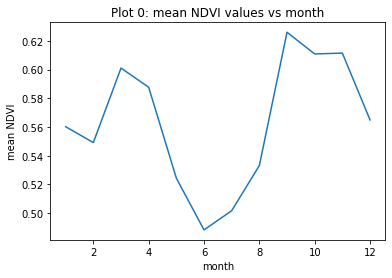

In [245]:
p0.groupby(['month'])['mean'].mean().plot()
plt.title('Plot 0: mean NDVI values vs month')
plt.xlabel('month') 
# Labeling the Y-axis 
plt.ylabel('mean NDVI') 

Text(0, 0.5, 'mean NDVI')

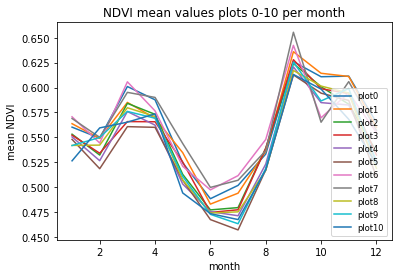

In [244]:
p0.groupby(['month'])['mean'].mean().plot(label='plot0')
p1.groupby(['month'])['mean'].mean().plot(label='plot1')
p2.groupby(['month'])['mean'].mean().plot(label='plot2')
p3.groupby(['month'])['mean'].mean().plot(label='plot3')
p4.groupby(['month'])['mean'].mean().plot(label='plot4')
p5.groupby(['month'])['mean'].mean().plot(label='plot5')
p6.groupby(['month'])['mean'].mean().plot(label='plot6')
p7.groupby(['month'])['mean'].mean().plot(label='plot7')
p8.groupby(['month'])['mean'].mean().plot(label='plot8')
p9.groupby(['month'])['mean'].mean().plot(label='plot9')
p10.groupby(['month'])['mean'].mean().plot(label='plot10')
plt.legend(loc = 'lower right', fontsize = 'small')
plt.title('NDVI mean values plots 0-10 per month')
plt.xlabel('month') 
# Labeling the Y-axis 
plt.ylabel('mean NDVI') 

- local decrease in February for all, except for plot10
- Plot 5 has the lowest value of 0.455 in July
- plots 9, 6, 7 all have the highest casualties of ~ 0.5 

Maps have been generated in QGIS and show the parcels that are being analyzed: 

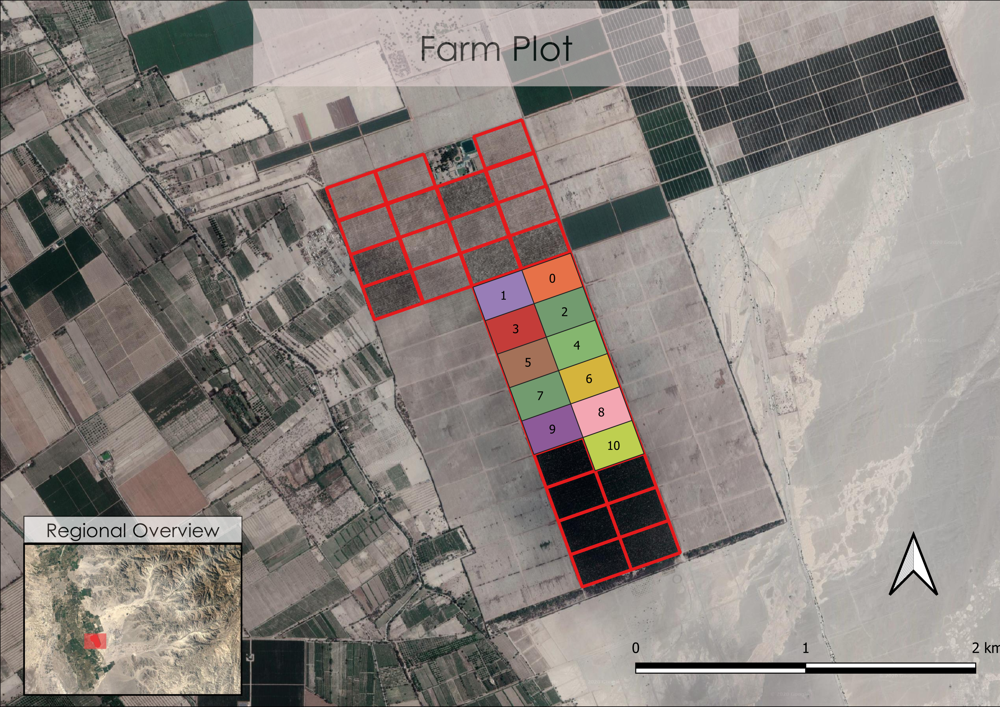

In [250]:
from IPython.display import Image
Image(r"group1.png")

Text(0, 0.5, 'mean NDVI')

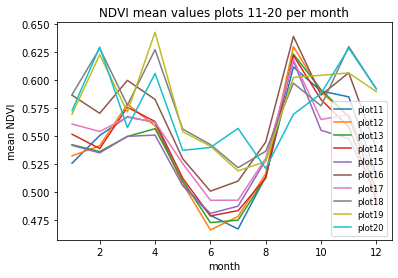

In [246]:
p11.groupby(['month'])['mean'].mean().plot(label='plot11')
p12.groupby(['month'])['mean'].mean().plot(label='plot12')
p13.groupby(['month'])['mean'].mean().plot(label='plot13')
p14.groupby(['month'])['mean'].mean().plot(label='plot14')
p15.groupby(['month'])['mean'].mean().plot(label='plot15')
p16.groupby(['month'])['mean'].mean().plot(label='plot16')
p17.groupby(['month'])['mean'].mean().plot(label='plot17')
p18.groupby(['month'])['mean'].mean().plot(label='plot18')
p19.groupby(['month'])['mean'].mean().plot(label='plot19')
p20.groupby(['month'])['mean'].mean().plot(label='plot20')
plt.legend(loc = 'lower right', fontsize = 'small')
plt.title('NDVI mean values plots 11-20 per month')
plt.xlabel('month') 
# Labeling the Y-axis 
plt.ylabel('mean NDVI')

- There is more variation in this collection of plots.
- Parcel20, parcel19, parcel18, parcel16, all have values higher than the trend
- Four peaks identified in February, April, September and November for the plot20,19,18 and 16 while others continue the trend of two peaks (March and September)
- You can see that geographically the northern parts of the farm (19,20,18) have a higher NDVI 

Text(0, 0.5, 'mean NDVI')

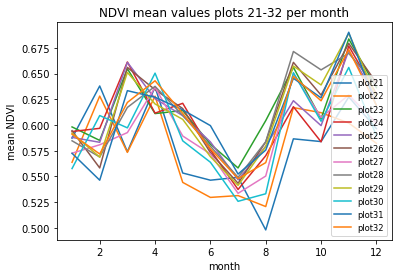

In [247]:
p21.groupby(['month'])['mean'].mean().plot(label='plot21')
p22.groupby(['month'])['mean'].mean().plot(label='plot22')
p23.groupby(['month'])['mean'].mean().plot(label='plot23')
p24.groupby(['month'])['mean'].mean().plot(label='plot24')
p25.groupby(['month'])['mean'].mean().plot(label='plot25')
p26.groupby(['month'])['mean'].mean().plot(label='plot26')
p27.groupby(['month'])['mean'].mean().plot(label='plot27')
p28.groupby(['month'])['mean'].mean().plot(label='plot28')
p29.groupby(['month'])['mean'].mean().plot(label='plot29')
p30.groupby(['month'])['mean'].mean().plot(label='plot30')
p31.groupby(['month'])['mean'].mean().plot(label='plot31')
p32.groupby(['month'])['mean'].mean().plot(label='plot32')
plt.legend(loc = 'lower right', fontsize = 'small')
plt.title('NDVI mean values plots 21-32 per month')
plt.xlabel('month') 
# Labeling the Y-axis 
plt.ylabel('mean NDVI')

- The minimum values are not as low as the other groups
- the initial months of the year show a lot of dispersion, with values ranging between 0.550 and 0.625
- parcel32 and parcela31 begin to decrease their NDVI before other parcels 

## Summary

- Clear seasonal impacts, lower values during winter (June, July, August), higher values during September to October and February to March. This indicates a higher density and health of the plants during September to October and February to March.
- The northern section of the farm has higher NDVI values, the lowest are in the central / lower section of the farm
- The NDVI has improved overall every year 

## Information on data
- There are no corrections for cloud impact or atmospheric corrections
- Actual NDVI values may be high because they are not corrected
- SentinelHub Settings
    - The NDVI data pre-processed by Sendintel instead of being calculated manually, these values ranged from 0 to 1
         data used cloud cover of a maximum of 20%
- The detected outliers (high_ndvi dataframe) in 2018 were not removed from the dataset due to time.
- The name of the tile used is "18LVK" except for two dates in November 2018 (5 and 10) where the name of the tile is "1LAE". This matches the identified outliers and should be investigated further for clarification.
- All the data used were in epsg: 4326

## Future investigation
review the yield (Kg / Ha) of the crop with NDVI extracted

predictive modeling 